In [1]:
import torch
import torch.nn as nn
import os
import absl.logging
# Suppress Abseil logs
absl.logging.get_absl_handler().python_handler.stream = open(os.devnull, 'w')
absl.logging.set_verbosity(absl.logging.FATAL)
absl.logging.set_stderrthreshold(absl.logging.FATAL)

In [2]:
class ResBlockMLP(nn.Module):
    def __init__(self, input_size, output_size):
        super(ResBlockMLP, self).__init__()
        # Define the layers for the residual block
        self.norm1 = nn.LayerNorm(input_size)
        self.fc1 = nn.Linear(input_size, input_size // 2)
        
        self.norm2 = nn.LayerNorm(input_size // 2)
        self.fc2 = nn.Linear(input_size // 2, output_size)
        
        self.fc3 = nn.Linear(input_size, output_size)

        self.act = nn.ELU()

    def forward(self, x):
        # Forward pass of the residual block
        x = self.act(self.norm1(x))
        skip = self.fc3(x)
        
        x = self.act(self.norm2(self.fc1(x)))
        x = self.fc2(x)
        
        return x + skip

class PoseDetector(nn.Module):
    def __init__(self, num_frames, num_points, num_coor, output_size, num_blocks=1):
        super(PoseDetector, self).__init__()
        seq_len = num_frames*num_points*num_coor
        # flatten
        # print(seq_len, seq_len*4)
        self.input_mlp = nn.Sequential(
            nn.Linear(seq_len, 4*seq_len),
            nn.ReLU(),
            nn.Linear(4*seq_len, 128))
        self.lstm = nn.LSTM(128, 128, 1)

        blocks = [ResBlockMLP(128, 128) for _ in range(num_blocks)]
        self.res_blocks = nn.Sequential(*blocks)

        self.fc_out = nn.Linear(128, output_size)
        self.act = nn.ReLU()
        # self.softmax = nn.Softmax(output_size)

    def forward(self, x, h, m):
        # print(x.shape)
        # want it to be 32x(dimension size)
        x = x.reshape(x.shape[0], -1)
        # print(x.shape)
        x = self.input_mlp(x).unsqueeze(0)
        
        x, (h, m) = self.lstm(x, (h, m))

        x = self.act(self.res_blocks(x)).squeeze(0)

        return self.fc_out(x), h, m

In [3]:
device = torch.device(0 if torch.cuda.is_available() else 'cpu')
loss_fn = nn.MSELoss()

In [4]:
num_classes = 10
pd = PoseDetector(16, 21, 3, num_classes, 1).to(device)
inp = torch.randn(32, 16, 21, 3)

Show an example of how the model is used. Create hidden and mem buffers that are zeroed and put the random numbers into the model. Compare it with a fake ground truth and get a MSE loss to see how it performs.

In [5]:
from torch import optim
loss = 0
hidden = torch.zeros(1, inp.shape[0], 128, device=device)
mem = torch.zeros(1, inp.shape[0], 128, device=device)
seq_block = inp[:, :].to(device)
out, h, m = pd(seq_block, hidden, mem)
gt = torch.tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0])
gt = gt.repeat(32, 1)

print(out.shape)
print(gt.size())
loss += loss_fn(out, gt.to(device))
print(loss)


torch.Size([32, 10])
torch.Size([32, 10])
tensor(0.1475, device='cuda:0', grad_fn=<AddBackward0>)


In [6]:
from datasets.video_attr import Video_dataset
from utils.Augmentation import get_augmentation
from dotmap import DotMap
import torch.backends.cudnn as cudnn
import yaml

path = '/scratch/tkg5kq/BIKE/configs/wlasl/wlasl_k400_finetune.yaml'
# path = '/scratch/tkg5kq/BIKE/configs/k400/k400_train_video_attr_vitb-32-f8.yaml'
with open(path, 'r') as f:
    config = yaml.load(f, Loader=yaml.FullLoader)
config = DotMap(config)

device = "cpu"
if torch.cuda.is_available():
    device = "cuda"
    cudnn.benchmark = True

transform_train = get_augmentation(True, config)
transform_val = get_augmentation(False, config)
print(config.data.attributes_train_path)
train_data = Video_dataset(
        config.data.train_root, config.data.train_list,
        config.data.label_list, num_segments=config.data.num_segments,
        modality=config.data.modality,
        image_tmpl=config.data.image_tmpl, random_shift=config.data.random_shift,
        transform=transform_train, dense_sample=config.data.dense,
        select_topk_attributes=config.data.select_topk_attributes,
        attributes_path=None,
        train_video=False,
        train_pose=True)



/home/tkg5kq/.local/lib/python3.11/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: '/sfs/gpfs/tardis/home/tkg5kq/.local/lib/python3.11/site-packages/torchvision/image.so: undefined symbol: _ZN3c1017RegisterOperatorsD1Ev'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(
/home/tkg5kq/.conda/envs/video/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


DotMap()
video number:112


In [7]:
import os
import sys
import numpy as np
import cv2
# default Python logging output behavior when present.
if 'absl.logging' in sys.modules:
  from absl import logging
  logging.set_stderrthreshold('fatal')  
  logging.set_verbosity(logging.ERROR)
import mediapipe as mp

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '5'  # Suppresses TensorFlow logs if used
os.environ["GLOG_minloglevel"] ="5"
os.environ['OPENCV_LOG_LEVEL'] = 'ERROR'

class MP():
  def __init__(self):
    debug = False
    # Redirect stdout and stderr to suppress logs
    # sys.stdout = open(os.devnull, 'w')
    sys.stderr = open(os.devnull, 'w')
    print("initialize")
    video = '/home/tkg5kq/.cache/kagglehub/datasets/risangbaskoro/wlasl-processed/versions/5/videos/56811.mp4'
    self.get_hands(video)
  
  def __del__(self):
    # sys.stdout = sys.__stdout__
    sys.stderr = sys.__stderr__

  def mediapipe_to_numpy(self, landmark):
    np_arr = np.zeros(shape=(len(landmark), 3), dtype=float)
    for i, _landmark in enumerate(landmark):
      np_arr[i, 0] = _landmark.x
      np_arr[i, 1] = _landmark.y
      np_arr[i, 2] = _landmark.z
    return np_arr

  def make_annotated_frame(self, mp_drawing, mp_drawing_styles, idx, results, image_width, image_height):
    for hand_landmarks in results.multi_hand_landmarks:
      np_arr = self.mediapipe_to_numpy(hand_landmarks.landmark)
      print('hand_landmarks:', hand_landmarks)
      print(
          f'Index finger tip coordinates: (',
          f'{hand_landmarks.landmark[mp_hands.HandLandmark.INDEX_FINGER_TIP].x * image_width}, '
          f'{hand_landmarks.landmark[mp_hands.HandLandmark.INDEX_FINGER_TIP].y * image_height})'
      )
      print(type(hand_landmarks))
      print(len(hand_landmarks.landmark))
      print(len(mp_hands.HandLandmark))
      print(dir(hand_landmarks))
      print(np_arr.shape)
      # Create annotated image
      mp_drawing.draw_landmarks(
          annotated_image,
          hand_landmarks,
          mp_hands.HAND_CONNECTIONS,
          mp_drawing_styles.get_default_hand_landmarks_style(),
          mp_drawing_styles.get_default_hand_connections_style())
      cv2.imwrite(
          '/tmp/annotated_image' + str(idx) + '.png', cv2.flip(annotated_image, 1))

  def get_hands(self, video, debug=False):
    cap = cv2.VideoCapture(video)

    mp_drawing = mp.solutions.drawing_utils
    mp_drawing_styles = mp.solutions.drawing_styles
    mp_hands = mp.solutions.hands

    
    with mp_hands.Hands(
        static_image_mode=True,
        max_num_hands=2,
        min_detection_confidence=0.5) as hands:
      idx = 0
      while(cap.isOpened()):
        ret, frame = cap.read()
        
        # Read an image, flip it around y-axis for correct handedness output (see
        # above).
        # frame = cv2.imread(directory + file)
        image = cv2.flip(frame, 1)
        # Convert the BGR image to RGB before processing.
        results = hands.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

        # Print handedness and draw hand landmarks on the image.
        # print('Handedness:', results.multi_handedness)
        if results.multi_hand_landmarks:
          if debug:
            image_height, image_width, _ = image.shape
            annotated_image = image.copy()
            self.make_annotated_frame(mp_drawing, mp_drawing_styles, idx, results, image_width, image_height)

          for hand_world_landmarks in results.multi_hand_world_landmarks:
            print(dir(hand_world_landmarks))
            np_arr = self.mediapipe_to_numpy(hand_world_landmarks.landmark)
            if debug:
              mp_drawing.plot_landmarks(
                hand_world_landmarks, mp_hands.HAND_CONNECTIONS, azimuth=5)
            print(np_arr)
            
          idx += 1
          if idx == 1:
            break

In [8]:
media_pipe = MP()
video = '/home/tkg5kq/.cache/kagglehub/datasets/risangbaskoro/wlasl-processed/versions/5/videos/56811.mp4'


initialize


I0000 00:00:1733426831.006856   84005 gl_context_egl.cc:85] Successfully initialized EGL. Major : 1 Minor: 5
I0000 00:00:1733426831.179526   84841 gl_context.cc:357] GL version: 3.2 (OpenGL ES 3.2 NVIDIA 550.54.14), renderer: NVIDIA A40/PCIe/SSE2
INFO: Created TensorFlow Lite XNNPACK delegate for CPU.
W0000 00:00:1733426831.229330   84754 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1733426831.240105   84792 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


['ByteSize', 'Clear', 'ClearExtension', 'ClearField', 'CopyFrom', 'DESCRIPTOR', 'DiscardUnknownFields', 'Extensions', 'FindInitializationErrors', 'FromString', 'HasExtension', 'HasField', 'IsInitialized', 'ListFields', 'MergeFrom', 'MergeFromString', 'ParseFromString', 'RegisterExtension', 'SerializePartialToString', 'SerializeToString', 'SetInParent', 'UnknownFields', 'WhichOneof', '_CheckCalledFromGeneratedFile', '_ListFieldsItemKey', '_SetListener', '__class__', '__deepcopy__', '__delattr__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getstate__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__setstate__', '__sizeof__', '__slots__', '__str__', '__subclasshook__', '__unicode__']
[[ 1.02378596e-02  4.66298908e-02  6.45369068e-02]
 [-9.87816043e-03  1.99709050e-02  5.50761148e-02]
 [-1.70401987e-02  1.35402381e-03  4.29936722e-0

In [9]:
media_pipe.get_hands(video)

W0000 00:00:1733426832.239401   84764 landmark_projection_calculator.cc:186] Using NORM_RECT without IMAGE_DIMENSIONS is only supported for the square ROI. Provide IMAGE_DIMENSIONS or use PROJECTION_MATRIX.
I0000 00:00:1733426832.285919   84005 gl_context_egl.cc:85] Successfully initialized EGL. Major : 1 Minor: 5
I0000 00:00:1733426832.330245   84946 gl_context.cc:357] GL version: 3.2 (OpenGL ES 3.2 NVIDIA 550.54.14), renderer: NVIDIA A40/PCIe/SSE2
W0000 00:00:1733426832.345055   84897 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1733426832.357378   84926 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
I0000 00:00:1733426836.993858   84005 gl_context_egl.cc:85] Successfully initialized EGL. Major : 1 Minor: 5
I0000 00:00:1733426837.055728   85021 gl_context.cc:357] GL version: 3.2 

['ByteSize', 'Clear', 'ClearExtension', 'ClearField', 'CopyFrom', 'DESCRIPTOR', 'DiscardUnknownFields', 'Extensions', 'FindInitializationErrors', 'FromString', 'HasExtension', 'HasField', 'IsInitialized', 'ListFields', 'MergeFrom', 'MergeFromString', 'ParseFromString', 'RegisterExtension', 'SerializePartialToString', 'SerializeToString', 'SetInParent', 'UnknownFields', 'WhichOneof', '_CheckCalledFromGeneratedFile', '_ListFieldsItemKey', '_SetListener', '__class__', '__deepcopy__', '__delattr__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getstate__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__setstate__', '__sizeof__', '__slots__', '__str__', '__subclasshook__', '__unicode__']
[[ 1.02378596e-02  4.66298908e-02  6.45369068e-02]
 [-9.87816043e-03  1.99709050e-02  5.50761148e-02]
 [-1.70401987e-02  1.35402381e-03  4.29936722e-0

In [18]:
from torch.utils.data import DataLoader
# from ortools.linear_solver import pywraplp
# from ortools.init import pywrapinit 
# cpp_flags = pywrapinit.CppFlags()
# cpp_flags.logtostderr = True
# cpp_flags.log_prefix = False
# cpp_flags.logtostderr = False
# Configure absl logging to suppress logs

import os
import sys
import numpy as np


def train(pd, train_loader, optimizer, criterion, epoch):
  cnt = 0
  training_loss_logger = []
  loss = 0
  for i, (pose, class_id) in enumerate(train_loader):
    expected_len = 32
    curr_len = 32
    if pose.shape[0] < expected_len:
      curr_len = pose.shape[0]
      pose = pose.repeat(2, 1, 1, 1)
      pose = pose[:expected_len, :, :, : ]
    if class_id.shape[0] < expected_len:
      curr_len = pose.shape[0]
      class_id = class_id.repeat(2)[:expected_len]
    
    hidden = torch.zeros(1, inp.shape[0], 128)
    mem = torch.zeros(1, inp.shape[0], 128)
    pose = pose.type(torch.FloatTensor)

    # move to device
    pose = pose.to(device)
    tmp = np.zeros((32, 10))
    for idx in class_id:
        tmp[idx] = 1
    class_id = torch.from_numpy(tmp).type(torch.FloatTensor)
    class_id = class_id.to(device)
    hidden = hidden.to(device)
    mem = mem.to(device)

    out, h, m = pd(pose, hidden, mem)

    loss = criterion(out[:, :curr_len], class_id[:, :curr_len])

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    print(f'Epoch [{epoch}]: iteration {i+1}: loss {loss.item()/(i+1)}')
    training_loss_logger.append(loss.item())
    
    cnt += 1
    if cnt > 10:
      break

  return training_loss_logger

In [19]:
# train_sampler = torch.utils.data.distributed.DistributedSampler(train_data)                       
train_loader = DataLoader(train_data, batch_size=config.data.batch_size, drop_last=False)

pd = PoseDetector(16, 21, 3, num_classes, 1).to(device)

learning_rate = 1e-4
optimizer = optim.Adam(pd.parameters(), lr=learning_rate)
criterion = nn.CrossEntropyLoss()

total_loss = []
for epoch in range(40):
  loss = train(pd, train_loader, optimizer, criterion, epoch)
  print(f'Epoch {epoch}: total {loss}')
  total_loss.append(loss)

Epoch [0]: iteration 1: loss 2.1724181175231934
Epoch [0]: iteration 2: loss 1.444074034690857
Epoch [0]: iteration 3: loss 0.960951010386149
Epoch [0]: iteration 4: loss 0.35998499393463135
Epoch 0: total [2.1724181175231934, 2.888148069381714, 2.8828530311584473, 1.4399399757385254]
Epoch [1]: iteration 1: loss 2.1601390838623047
Epoch [1]: iteration 2: loss 1.4402871131896973
Epoch [1]: iteration 3: loss 0.9598265488942465
Epoch [1]: iteration 4: loss 0.36004477739334106
Epoch 1: total [2.1601390838623047, 2.8805742263793945, 2.8794796466827393, 1.4401791095733643]
Epoch [2]: iteration 1: loss 2.16005802154541
Epoch [2]: iteration 2: loss 1.439957618713379
Epoch [2]: iteration 3: loss 0.9596115748087565
Epoch [2]: iteration 4: loss 0.3598863482475281
Epoch 2: total [2.16005802154541, 2.879915237426758, 2.8788347244262695, 1.4395453929901123]
Epoch [3]: iteration 1: loss 2.1591689586639404
Epoch [3]: iteration 2: loss 1.439610242843628
Epoch [3]: iteration 3: loss 0.9596873919169108


FileNotFoundError: [Errno 2] No such file or directory: '/sfs/gpfs/tardis/home/tkg5kq/.cache/kagglehub/datasets/risangbaskoro/wlasl-processed/versions/5/frames_wlasl_10/cousin/13646/image_0001.jpg'

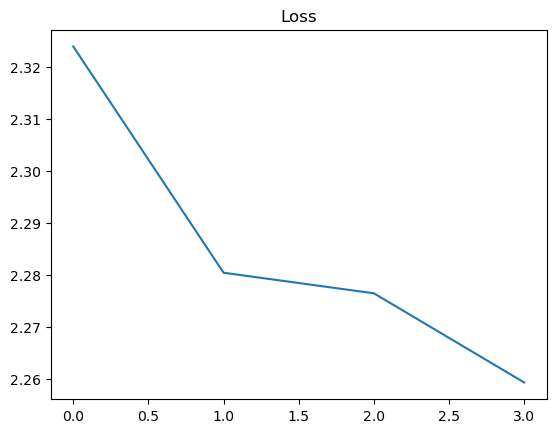

In [16]:
import numpy as np
import matplotlib.pyplot as plt

loss1 =  1.6780547553842717
loss2 = 1.5839966318824075

loss = [
2.3238882368261162,
2.2804002328352495,
2.2764460173520176,
2.25930515202609
]

plt.figure()
plt.title('Loss')
plt.plot(loss)
plt.show()

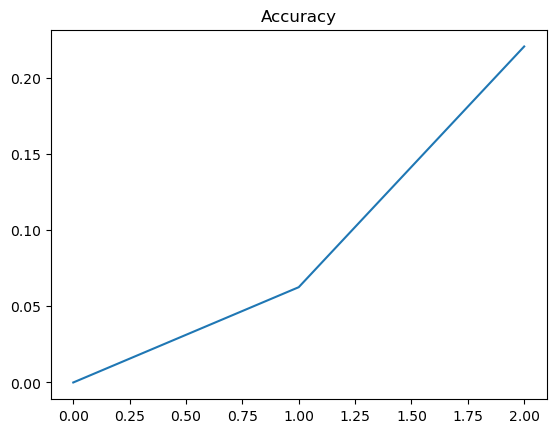

In [11]:
import numpy as np
import matplotlib.pyplot as plt

loss1 =  1.6780547553842717
loss2 = 1.5839966318824075

loss = [0,
.0625,
0.22039473684210525,
0.22039473684210525
]

plt.figure()
plt.title('Accuracy')
plt.plot(loss)
plt.show()